# Build the initial DVC murine hierarchy

### Load packages/libraries

In [1]:
import os
os.chdir('../')
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [2]:
import scanpy as sc
import torch
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import gdown
import copy as cp
import seaborn as sns
import pandas as pd
import anndata as ad
from scipy.sparse import hstack, csc_matrix

In [3]:
import scarches as sca
import scHPL
from scarches.dataset.trvae.data_handling import remove_sparsity

Global seed set to 0


### Load the murine dataset

The first dataset uploaded is the murine dataset established by us in Hes et al. (2024), which contains high quality singlets only. The counts and log-normalized counts (i.e. layer 'data'), the cells metadata, with cells labeled, and the genes metadata tables were converted from a Seurat object to h5ad format in R as specified in the manuscript methods.

In [4]:
adata = sc.read('harmony_final_allmice_merged.h5ad')
adata

AnnData object with n_obs × n_vars = 99740 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'ratio_nCount_nFeat', 'doubletfinder_class', 'seq_sample', 'treatment', 'single_r_celltypes', 'chen_celltypes', 'tasic_celltypes', 'romanov_celltypes', 'camp1_celltypes_full', 'identity_layer1', 'identity_layer2', 'identity_layer3'
    var: 'mvp.mean', 'mvp.dispersion', 'mvp.dispersion.scaled', 'mvp.variable'
    layers: 'counts', 'data'

### treeArches pipeline

In [5]:
adata.X = adata.layers["counts"].copy()
adata.raw = adata
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [6]:
#Using 2500 most variable genes
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2500,
    batch_key="orig.ident",
    subset=True)
adata

AnnData object with n_obs × n_vars = 99740 × 2500
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'ratio_nCount_nFeat', 'doubletfinder_class', 'seq_sample', 'treatment', 'single_r_celltypes', 'chen_celltypes', 'tasic_celltypes', 'romanov_celltypes', 'camp1_celltypes_full', 'identity_layer1', 'identity_layer2', 'identity_layer3'
    var: 'mvp.mean', 'mvp.dispersion', 'mvp.dispersion.scaled', 'mvp.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'
    layers: 'counts', 'data'

In [7]:
#Add the study to the datasets
adata.obs["study"] = "Hes"

#Ensure that the cell type labels of each dataset are unique
adata.obs['cellident_study'] = np.char.add(np.char.add(np.array(adata.obs['identity_layer3'],dtype= str), '_'),
                                           np.array(adata.obs['study'], dtype=str))

In [8]:
#Create SCVI model and train it
sca.models.SCVI.setup_anndata(adata, batch_key="orig.ident")

In [9]:
vae = sca.models.SCVI(
    adata,
    n_layers=2,
    encode_covariates=True,
    deeply_inject_covariates=False,
    use_layer_norm="both",
    use_batch_norm="none",
)
vae

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Not Trained

In [10]:
vae.train(max_epochs=80)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 80/80: 100%|███████████| 80/80 [37:06<00:00, 27.83s/it, loss=402, v_num=1]


In [11]:
#Get the latent representation
reference_latent = sc.AnnData(vae.get_latent_representation())
reference_latent

AnnData object with n_obs × n_vars = 99740 × 10

In [12]:
#Transfer variables from the original data to the latent representation
reference_latent.obs["orig.ident"] = adata.obs["orig.ident"].tolist()
reference_latent.obs["seq_sample"] = adata.obs["seq_sample"].tolist()
reference_latent.obs["identity_layer1"] = adata.obs["identity_layer1"].tolist()
reference_latent.obs["identity_layer2"] = adata.obs["identity_layer2"].tolist()
reference_latent.obs["cell_identity"] = adata.obs["cellident_study"].tolist()
reference_latent.obs["study"] = adata.obs["study"].tolist()

In [13]:
sc.pp.neighbors(reference_latent, n_neighbors=8)
sc.tl.leiden(reference_latent)
sc.tl.umap(reference_latent)

In [14]:
reference_latent.obs['orig.ident'] = reference_latent.obs['orig.ident'].astype('category')

#Reorder categories, so smallest dataset is plotted on top
reference_latent.obs['orig.ident'].cat.reorder_categories(['fast','refed','licl','adlib','refeed','veh'], inplace=True)

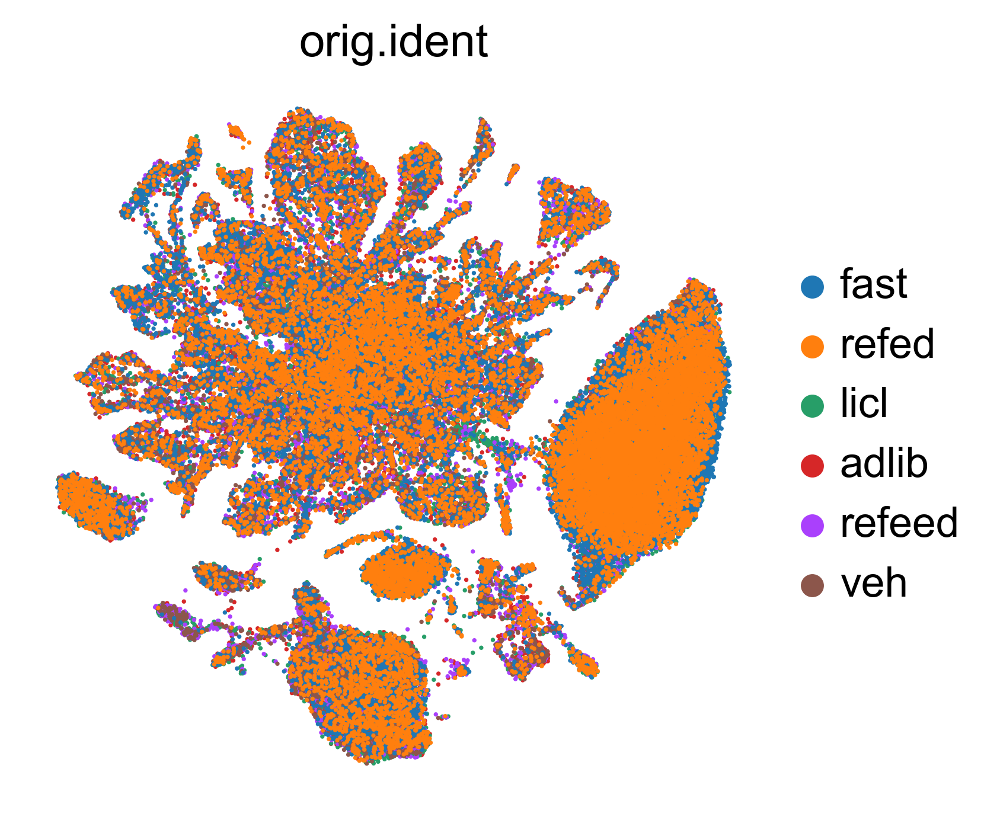

In [15]:
#Plot the samples (refeed = Refed 1; refed = Refed 2)
sc.pl.umap(reference_latent,
           color=['orig.ident'],
           s=7,
           frameon=False)

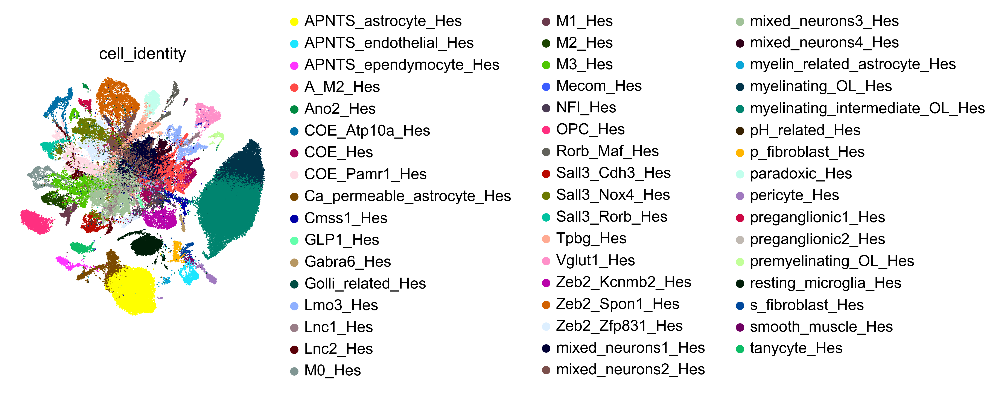

In [16]:
#Plot the cell identities
sc.pl.umap(reference_latent,
           color=['cell_identity'],
           s=5,
           frameon=False)

In [17]:
#Save reference latent
vae.save('ref_model_2500/', overwrite=True)
reference_latent.write('ref_model_2500/reference_latent_final_2500.h5ad')

In [18]:
#Save the new processed anndata
adata.write('allmice_adata_processed_2500.h5ad')

### Manual tree building

To have an initial tree with the cell identities at the three layers of granularity established by us, we followed treeArches pipeline

In [19]:
xx = reference_latent.obs.groupby(['identity_layer1', 'identity_layer2', 'cell_identity']).count()['study']

In [20]:
xx = xx.iloc[xx.values>0]
xx.index[0]

('connective', 'fibroblast', 'p_fibroblast_Hes')

In [21]:
ref_mtree = scHPL.utils.create_tree('root')

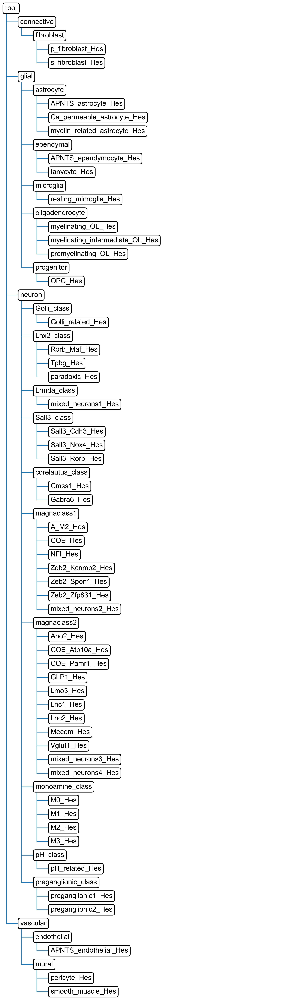

In [22]:
node_added = []
parent1 = None
parent2 = None

for ind in xx.index:
    
    for i, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                ref_mtree[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)

                
scHPL.utils.print_tree(ref_mtree)

#### Train the classifier

In [23]:
 np.array(reference_latent.obs.cell_identity.values)

array(['mixed_neurons1_Hes', 'M3_Hes', 'APNTS_astrocyte_Hes',
       'mixed_neurons3_Hes', 'Ca_permeable_astrocyte_Hes',
       'myelinating_intermediate_OL_Hes', 'COE_Hes', ...,
       'mixed_neurons2_Hes', 'APNTS_astrocyte_Hes',
       'myelinating_intermediate_OL_Hes', 'Sall3_Nox4_Hes', 'OPC_Hes',
       'myelinating_intermediate_OL_Hes', 'mixed_neurons1_Hes'],
      dtype=object)

In [24]:
reference_latent.X

array([[ 0.07,  0.94,  0.02, -0.6 , -0.5 ,  0.95, -0.9 , -0.07, -0.57,
        -1.18],
       [-0.25, -0.91,  0.18,  0.22,  0.36,  0.78, -2.15,  0.41,  0.54,
        -0.05],
       [-1.83, -0.43, -0.92, -0.11,  0.06,  0.17,  0.3 ,  0.34,  0.39,
         1.72],
       [ 0.09, -0.08, -0.24, -0.13,  0.4 ,  0.99, -1.68,  1.01,  0.84,
        -0.75],
       [-0.81, -0.47,  1.61,  0.79, -0.73,  0.59, -0.27,  1.29, -1.83,
         1.51],
       [ 2.22, -0.11, -0.27,  1.17, -0.72, -0.44, -0.7 , -0.8 ,  0.63,
         1.11],
       [ 0.01, -0.46,  0.4 , -1.05, -0.37, -1.71, -0.04, -1.71,  0.73,
        -1.86],
       ...,
       [-0.51,  0.79, -0.06, -0.67,  0.72, -0.19, -1.04,  1.86,  0.2 ,
        -1.8 ],
       [-0.94,  0.25, -0.04,  0.8 ,  1.07,  1.43,  0.49,  0.34, -0.5 ,
         1.58],
       [ 1.99, -0.81, -1.89,  0.43, -1.26,  0.66,  0.83,  0.51,  1.2 ,
         0.17],
       [-0.69,  0.76,  0.98, -1.27, -0.81,  1.2 ,  0.57,  0.97,  1.35,
        -0.51],
       [-1.14, -1.6 ,  0.31, -3

In [25]:
ref_mtree = scHPL.train.train_tree(reference_latent.X, 
                                   np.array(reference_latent.obs.cell_identity.values), 
                                   ref_mtree, 
                                   classifier = 'knn', 
                                   dimred = False, 
                                   useRE = True, 
                                   FN = 0.5, 
                                   n_neighbors = 50, 
                                  dynamic_neighbors = True)

In [26]:
##Save the tree
import pickle
file_to_store = open("ref_model_2500/manual_tree_ref_2500.pickle", "wb")
pickle.dump(ref_mtree, file_to_store)
file_to_store.close()

### Update hierarchy with Ludwig data

We have trained our initial tree using the murine DVC dataset. Now we will add the publicly available dataset from Ludwig et al. (2021) DOI: 10.1038/s42255-021-00363-1. This dataset was prepared using the Notebook **"datasets_DVC_preparation.ipynb"** because some of the 2,500 most variable genes in our dataset were not present in this dataset, so we added those genes with counts=0 for each cell to be able to apply this pipeline.

In [27]:
#Ludwig publicly available dataset 
adata_ludwig = sc.read('DVC_datasets_2500/ludwig_database_2500.h5ad')
adata_ludwig

AnnData object with n_obs × n_vars = 72128 × 28254
    obs: 'Unnamed: 0', 'nCount_RNA', 'nFeature_RNA', 'seq_sample', 'percent.mito', 'percent.ribo', 'cell.type', 'neuronal.subtype', 'study', 'cell_barcode', 'treatment', 'identity_layer3'
    layers: 'counts'

We consolidated the highest resolution cell identity established by Ludwig et al. in the original publication in the variable called 'identity_layer3'

In [28]:
adata_ludwig.obs

,Unnamed: 0,nCount_RNA,nFeature_RNA,seq_sample,percent.mito,percent.ribo,cell.type,neuronal.subtype,study,cell_barcode,treatment,identity_layer3
21V_AAACCTGAGCCGGTAA,21V_AAACCTGAGCCGGTAA,690,505,21V,0.010145,0.007246,Astrocytes,Glial cells,ludwig,AAACCTGAGCCGGTAA,adlib_vehicle,Astrocytes
21V_AAACCTGAGCGCTCCA,21V_AAACCTGAGCGCTCCA,567,423,21V,0.005291,0.010582,Astrocytes,Glial cells,ludwig,AAACCTGAGCGCTCCA,adlib_vehicle,Astrocytes
21V_AAACCTGCACATCCGG,21V_AAACCTGCACATCCGG,3789,1942,21V,0.000528,0.004487,Neurons,GABA1,ludwig,AAACCTGCACATCCGG,adlib_vehicle,Neur_GABA1
21V_AAACCTGCAGCTGGCT,21V_AAACCTGCAGCTGGCT,1107,772,21V,0.002710,0.009033,Neurons,GABA4,ludwig,AAACCTGCAGCTGGCT,adlib_vehicle,Neur_GABA4
21V_AAACCTGCATCCGTGG,21V_AAACCTGCATCCGTGG,619,397,21V,0.003231,0.009693,Oligodendrocytes,Glial cells,ludwig,AAACCTGCATCCGTGG,adlib_vehicle,Oligodendrocytes
...,...,...,...,...,...,...,...,...,...,...,...,...
25V_TTTGTCAAGACGCACA,25V_TTTGTCAAGACGCACA,1072,689,25V,0.000933,0.004664,Tanycyte-like cells,Glial cells,ludwig,TTTGTCAAGACGCACA,adlib_vehicle,Tanycyte-like
25V_TTTGTCAAGCGTGTCC,25V_TTTGTCAAGCGTGTCC,892,611,25V,0.001121,0.006726,Ependymal cells,Glial cells,ludwig,TTTGTCAAGCGTGTCC,adlib_vehicle,Ependymal
25V_TTTGTCAAGGATCGCA,25V_TTTGTCAAGGATCGCA,1710,1056,25V,0.000000,0.007602,Neurons,GABA2,ludwig,TTTGTCAAGGATCGCA,adlib_vehicle,Neur_GABA2
25V_TTTGTCAAGGCTAGGT,25V_TTTGTCAAGGCTAGGT,2597,1418,25V,0.000000,0.004621,Neurons,Glu1,ludwig,TTTGTCAAGGCTAGGT,adlib_vehicle,Neur_Glu1


In [29]:
adata_ludwig.raw = adata_ludwig
adata_ludwig = adata_ludwig.copy()

In [30]:
#Normalize ludwig dataset
sc.pp.normalize_total(adata_ludwig)

#Subset the ludwig dataset to match our processed dataset (i.e. including our original 2,500 most variable genes only)
adata_ludwig = adata_ludwig[:, adata.var_names]
adata_ludwig

View of AnnData object with n_obs × n_vars = 72128 × 2500
    obs: 'Unnamed: 0', 'nCount_RNA', 'nFeature_RNA', 'seq_sample', 'percent.mito', 'percent.ribo', 'cell.type', 'neuronal.subtype', 'study', 'cell_barcode', 'treatment', 'identity_layer3'
    layers: 'counts'

In [31]:
#Add the variable 'orig.ident' to the dataset to match our variable (this is the study)
adata_ludwig.obs['orig.ident'] = adata_ludwig.obs['study']

#Ensure that the cell type labels of each dataset are unique
adata_ludwig.obs['cellident_study'] = np.char.add(np.char.add(np.array(adata_ludwig.obs['identity_layer3'],dtype= str), '_'),
                                                  np.array(adata_ludwig.obs['study'], dtype=str))

In [32]:
#Save the processed object
adata_ludwig.write('new_ludwig_database_2500.h5ad')

#### Build latent representation for new query (the Ludwig dataset)

In [33]:
model = sca.models.SCVI.load_query_data(
    adata_ludwig,
    'ref_model_2500/',
    freeze_dropout = True,
)

INFO     File ref_model_2500/model.pt already downloaded                                                           


In [34]:
model.train(max_epochs=50)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 50/50: 100%|███████████| 50/50 [10:04<00:00, 12.09s/it, loss=367, v_num=1]


In [35]:
query_latent = sc.AnnData(model.get_latent_representation())

In [36]:
query_latent.obs["orig.ident"] = adata_ludwig.obs["orig.ident"].tolist()
query_latent.obs["seq_sample"] = adata_ludwig.obs["seq_sample"].tolist()
query_latent.obs["study"] = adata_ludwig.obs["study"].tolist()
query_latent.obs["cell_identity"] = adata_ludwig.obs["cellident_study"].tolist()

In [37]:
#Save this new model
model.save('surgery_model_ludwig_2500/', overwrite=True)
query_latent.write('surgery_model_ludwig_2500/ludwig_latent_2500.h5ad')

### Prepare to update the hierarchy

In [38]:
#Concatenate both datasets
adata_full = adata.concatenate(adata_ludwig, batch_key="ref_query1")
adata_full

AnnData object with n_obs × n_vars = 171868 × 2500
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'ratio_nCount_nFeat', 'doubletfinder_class', 'seq_sample', 'treatment', 'single_r_celltypes', 'chen_celltypes', 'tasic_celltypes', 'romanov_celltypes', 'camp1_celltypes_full', 'identity_layer1', 'identity_layer2', 'identity_layer3', 'study', 'cellident_study', '_scvi_batch', '_scvi_labels', 'Unnamed: 0', 'percent.mito', 'percent.ribo', 'cell.type', 'neuronal.subtype', 'cell_barcode', 'ref_query1'
    var: 'mvp.mean-0', 'mvp.dispersion-0', 'mvp.dispersion.scaled-0', 'mvp.variable-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable_nbatches-0', 'highly_variable_intersection-0'
    layers: 'counts'

In [39]:
adata_full.write('surgery_model_ludwig_2500/hesludwig_adata_processed_2500.h5ad')

#### Obtain the latent representation

In [40]:
full_latent = sc.AnnData(model.get_latent_representation(adata=adata_full))

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [41]:
#Transfer variables to the latent representation
full_latent.obs['cell_identity'] = adata_full.obs["cellident_study"].tolist()
full_latent.obs['orig.ident'] = adata_full.obs["orig.ident"].tolist()
full_latent.obs['study'] = adata_full.obs["study"].tolist()
full_latent

AnnData object with n_obs × n_vars = 171868 × 10
    obs: 'cell_identity', 'orig.ident', 'study'

In [42]:
sc.pp.neighbors(full_latent)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)

In [43]:
full_latent.obs['study'] = full_latent.obs['study'].astype('category')
full_latent.obs['study']

0            Hes
1            Hes
2            Hes
3            Hes
4            Hes
           ...  
171863    ludwig
171864    ludwig
171865    ludwig
171866    ludwig
171867    ludwig
Name: study, Length: 171868, dtype: category
Categories (2, object): ['Hes', 'ludwig']

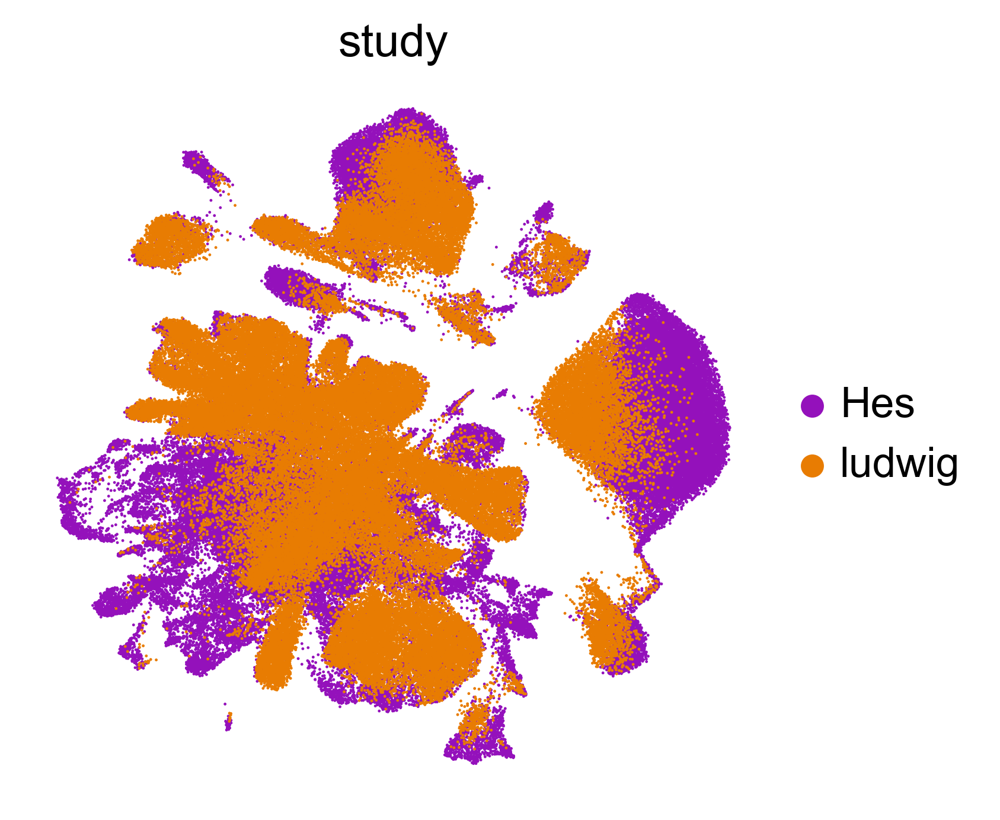

In [44]:
colors_umap =["#9411BB","#E87C02"]

sc.pl.umap(full_latent,
           color=['study'],
           s=3,
           frameon=False,
           palette= colors_umap)

In [45]:
full_latent.obs['orig.ident'].cat.reorder_categories(['fast','refed','licl','adlib','refeed','veh','ludwig'], inplace=True)

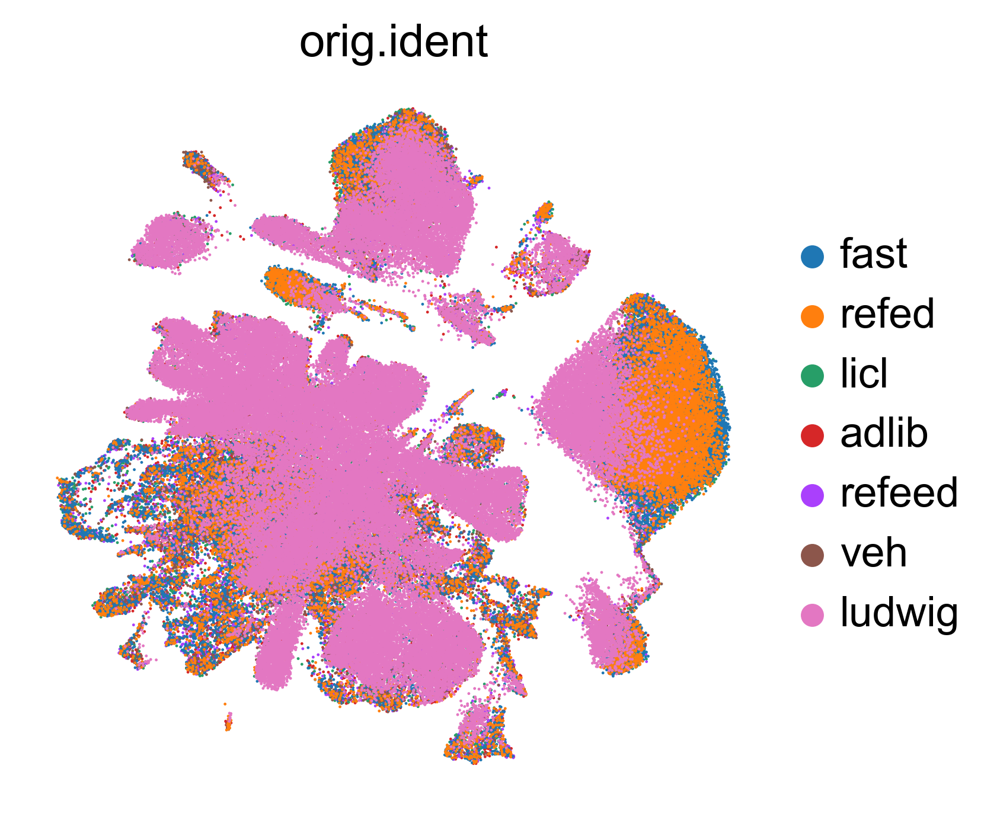

In [46]:
sc.pl.umap(full_latent,
           color=['orig.ident'],
           s=3,
           frameon=False)

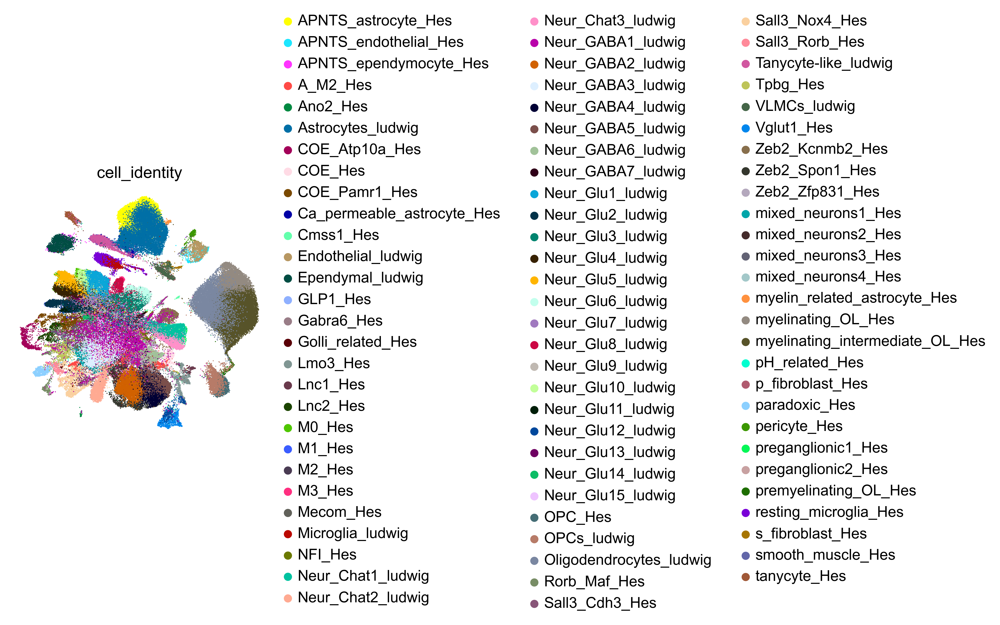

In [47]:
#Plot the cell identities
sc.pl.umap(full_latent,
           color=['cell_identity'],
           s=3,
           frameon=False)

In [48]:
#Save latent representation and full model
model.save('full_model_2500/', overwrite=True)
full_latent.write('full_model_2500/full_latent_2500.h5ad')

#### Add the Ludwig dataset to the murine DVC hierarchy

In [49]:
#Make a deep copy of the original classifier to ensure we do not overwrite it
tree_rq = cp.deepcopy(ref_mtree)

Starting tree:


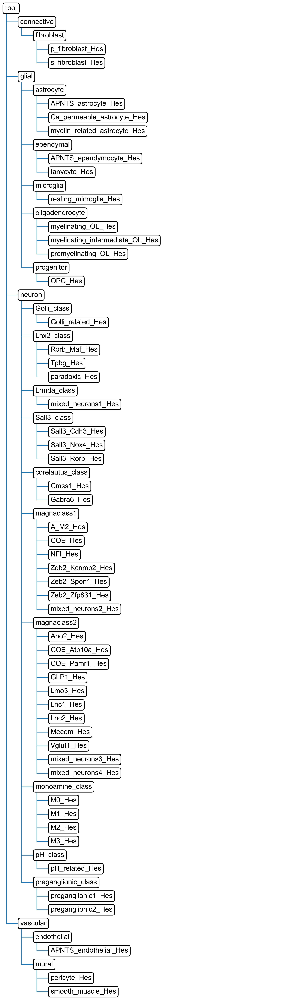


Adding dataset ludwig to the tree
Normalized CM
ypred                            Astrocytes_ludwig  Endothelial_ludwig  \
ytrue                                                                    
APNTS_astrocyte_Hes                       0.971228            0.000000   
APNTS_endothelial_Hes                     0.003120            0.734789   
APNTS_ependymocyte_Hes                    0.004237            0.000000   
A_M2_Hes                                  0.000358            0.000000   
Ano2_Hes                                  0.000000            0.000000   
COE_Atp10a_Hes                            0.000000            0.000000   
COE_Hes                                   0.000763            0.000000   
COE_Pamr1_Hes                             0.000000            0.000000   
Ca_permeable_astrocyte_Hes                0.673647            0.000000   
Cmss1_Hes                                 0.058522            0.000000   
GLP1_Hes                                  0.000000            0

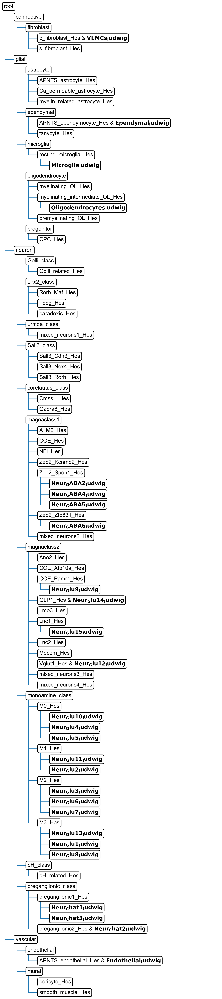

In [50]:
tree_rq, mp_rq = scHPL.learn_tree(data = full_latent, 
                                  batch_key = 'study',
                                  batch_order = ['ludwig'],
                                  batch_added = ['Hes'],
                                  cell_type_key= 'cell_identity',
                                  tree = tree_rq, 
                                  retrain = False,
                                  useRE=True,
                                  classifier = 'knn',
                                  dimred = False,
                                 print_conf=True)

In [51]:
##Save the tree (based on https://github.com/lcmmichielsen/treeArches-reproducibility/blob/main/Figure2-HLCA%20healthy/Figure2%2C%20S9-S13.ipynb)
file_to_store = open("full_model_2500/tree_full_HesLudwig_2500.pickle", "wb")
pickle.dump(tree_rq, file_to_store)
file_to_store.close()